In [1]:
import pandas as pd
import os
import json
import glob
import nltk
import sklearn
import numpy as np
import re
import math
from sklearn.manifold import TSNE

In [ ]:
# open the json file around 3 Gb
# I created later a file called sample-allyears-10000.csv with a random sample of 10k rows.
# I used that dataset to cluster everything to reduce the computational time 

def generator():
    with open ('data_science.json', 'r') as f:
        for line in f:
            yield json.loads(line)

df_base = generator()
df_base = pd.DataFrame(df_base)
df_base.head(5)

In [ ]:
# random sample of 10k rows
df_base = df_base.sample(n=10000)

In [ ]:
# Decompose the date into year, month and day and then keep only the years

df_base[['year', 'month', 'day']] = df_base['update_date'].str.split('-', expand=True)
df_base = df_base.drop(df_base[['month', 'day']], axis = 1)
df_base.shape


In [ ]:
# To select only recent papers (still a huge dataset >600k)
#df_base = df_base[df_base['year'] > 2020] 


In [242]:
# Check the new dataframe with the selected columns

docs_df = df_base[['id', 'authors', 'title', 'doi', 'categories', 'abstract', 'year']]
docs_df

,id,authors,title,doi,categories,abstract,year
1025318,1809.05302,Gal Binyamini,Some effective estimates for Andr\'e-Oort in $...,None,math.AG math.LO math.NT,Let $X\subset Y(1)^n$ be a subvariety define...,2021
1367435,2010.11105,"Stanislav B\""ohm, Jakub Ber\'anek",Runtime vs Scheduler: Analyzing Dask's Overheads,10.1109/WORKS51914.2020.00006,cs.DC,Dask is a distributed task framework which i...,2021
1993790,quant-ph/0503095,"Cristopher Moore, Daniel Rockmore, Alexander R...",The Power of Strong Fourier Sampling: Quantum ...,None,quant-ph,"Many quantum algorithms, including Shor's ce...",2007
1327071,2007.15557,"Zhonghan Wu, Yiran Gao, Jian Dai, Tian Zhang a...",Switching dynamics of reconfigurable perfect s...,None,physics.optics nlin.PS,Dual-coupled structure is typically used to ...,2020
1318114,2007.06600,"Yujun Shen, Bolei Zhou",Closed-Form Factorization of Latent Semantics ...,None,cs.CV,A rich set of interpretable dimensions has b...,2021
...,...,...,...,...,...,...,...
1425898,2102.09409,"Gregory Dumont, Alberto P\'erez-Cervera, Boris...",Adjoint Method for Macroscopic Phase-Resetting...,None,q-bio.NC,Brain rhythms emerge as a result of synchron...,2021
79507,0808.3375,"John F. Gibson, Jonathan Halcrow, and Predrag ...",Equilibrium and traveling-wave solutions of pl...,10.1017/S0022112009990863,physics.flu-dyn,We present ten new equilibrium solutions to ...,2015
282006,1108.3968,"Sylvain Le Corff (LTCI), Gersende Fort (LTCI)",Online Expectation Maximization based algorith...,None,math.ST stat.TH,The Expectation Maximization (EM) algorithm ...,2012
190698,1005.3158,Ruhollah Tavakoli,Improvement Cache Efficiency of Explicit Finit...,None,cs.DC,A simple method for improving cache efficien...,2010


In [243]:
# Converting the dataframe to a csv file and save it.
# docs_df.to_csv('sample_allyears-10000.csv')

In [2]:
# read the csv file with the 10k random samples

docs_df = pd.read_csv('sample_allyears-10000.csv', low_memory = False)
docs_df.head(5)

,Unnamed: 0,id,authors,title,doi,categories,abstract,year
0,1025318,1809.05302,Gal Binyamini,Some effective estimates for Andr\'e-Oort in $...,NaN,math.AG math.LO math.NT,Let $X\subset Y(1)^n$ be a subvariety define...,2021
1,1367435,2010.11105,"Stanislav B\""ohm, Jakub Ber\'anek",Runtime vs Scheduler: Analyzing Dask's Overheads,10.1109/WORKS51914.2020.00006,cs.DC,Dask is a distributed task framework which i...,2021
2,1993790,quant-ph/0503095,"Cristopher Moore, Daniel Rockmore, Alexander R...",The Power of Strong Fourier Sampling: Quantum ...,NaN,quant-ph,"Many quantum algorithms, including Shor's ce...",2007
3,1327071,2007.15557,"Zhonghan Wu, Yiran Gao, Jian Dai, Tian Zhang a...",Switching dynamics of reconfigurable perfect s...,NaN,physics.optics nlin.PS,Dual-coupled structure is typically used to ...,2020
4,1318114,2007.06600,"Yujun Shen, Bolei Zhou",Closed-Form Factorization of Latent Semantics ...,NaN,cs.CV,A rich set of interpretable dimensions has b...,2021


In [3]:
docs_df.shape

(10000, 8)

In [6]:
#Here is where we can actually start doing some Natural Language Processing.
#Step 1 is always to clean up our text. The raw text is kinda a hot mess, lots of extra symbols, tons of words which cloud the
#meaning of the text (stopwords, "the", "we", "a", etc. stuff like that)


#nltk.download('stopwords') need this for the first run.
stop_words = nltk.corpus.stopwords.words('english')
extraStopWords = ['et','al', 'al.', '(', ')', ',', '.', ':', ';', '%', '#', '@', '&', '!', '?', '[', ']', "''", "``", "'", 
                  '..', '...', '/', '-', '--', '>', '<', '=', '+', '\\']
stop_words.extend(extraStopWords)

clean_text = []

def normalize_doc(txt):
    for i in range(0,len(txt)):
    
        myText = txt.iloc[i]
        
        myText = re.sub(r'[^a-zA-Z0-9\s]','', myText, re.I) #Says match anything EXCEPT letters and numbers or whitespaces and turn them into blanks.
        myText = re.sub(r'\b[a-zA-Z]\b', '', myText, re.I) #removes single letters like ' a ' ' b ' surrounded by spaces
        myText = re.sub(r'\b\d*\b', '', myText) #Matches any number surrounded by word boundaries and removes them.
        myText = re.sub(r'\b\d.*\b', '', myText) #Matches any word starting in a number, and removes them. There is a LOT of junk
                                                  #like 2n, 2r, 3bc, 3d7, stuff like that.
        myText = re.sub(r'\b[a-zA-Z]\d*\b', '', myText) #Matches works like a12334 and a11111111, b24, stuff like this. These words tend to
                                                    #reference specific antibodies, compounds, etc. Not super useful for clustering.
        myText = myText.lower()
        myText = myText.strip()
        tokens = nltk.word_tokenize(myText)
        clean_tokens = [t for t in tokens if t not in stop_words]
        clean_text.append(' '.join(clean_tokens))
        
            


In [7]:
normalize_doc(docs_df['abstract'])
len(clean_text)

10000

In [8]:
from sklearn.feature_extraction.text import TfidfVectorizer

tf = TfidfVectorizer(ngram_range=(1,2), strip_accents = 'unicode', min_df=2, max_df=0.8)

#This is our vectorized data

tfidf_matrix = tf.fit_transform(clean_text)
tfidf_matrix.shape

(10000, 94892)

In [9]:
# tsne hyperparameter tuning

perplexity = [10, 20, 30, 40, 50]
list_hyperparameter = []
for i in range(0, len(perplexity)):
    
    tsne = TSNE(perplexity = perplexity[i], verbose=1, n_iter=5000)

    tsne_model = tsne.fit_transform(tfidf_matrix)
    list_hyperparameter.append(tsne_model)
   

/Users/mary/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/mary/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.009s...
[t-SNE] Computed neighbors for 10000 samples in 8.745s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.208445
[t-SNE] KL divergence after 50 iterations with early exaggeration: 110.073082
[t-SNE] KL divergence after 5000 iterations: 2.675483
[t-SNE] Computing 61 near

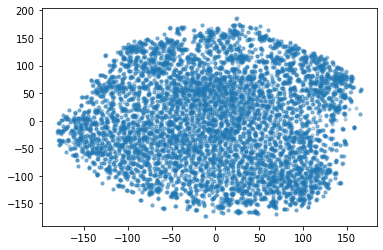

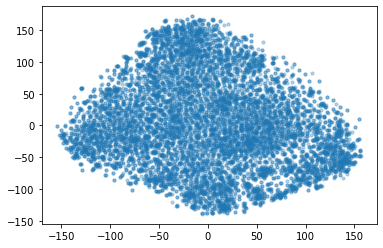

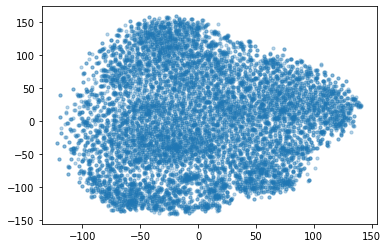

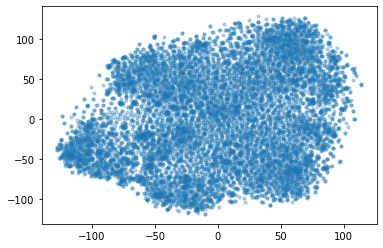

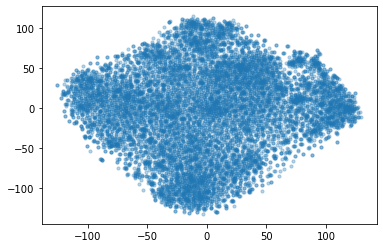

In [10]:
from matplotlib import pyplot as plt
for i in range(len(list_hyperparameter)):
    plt.scatter(list_hyperparameter[i][:,0], list_hyperparameter[i][:,1], alpha = 0.3, s=10)
    plt.show()

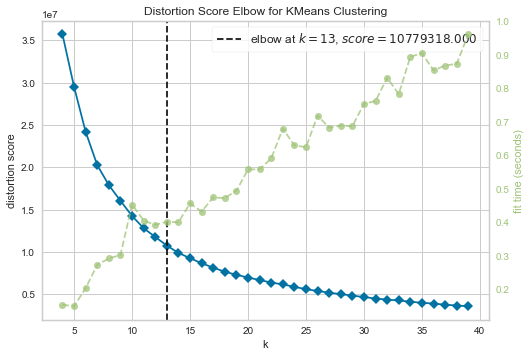

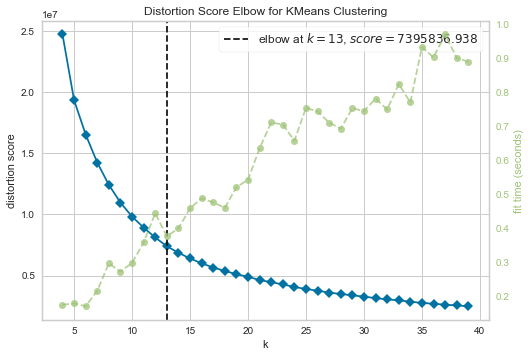

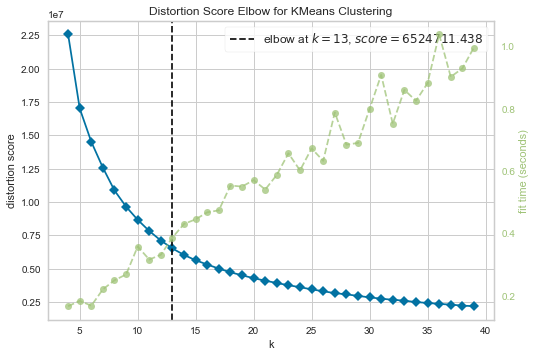

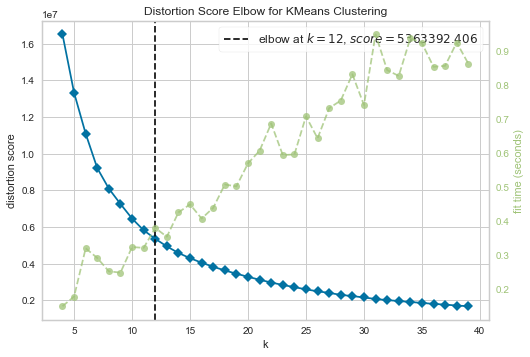

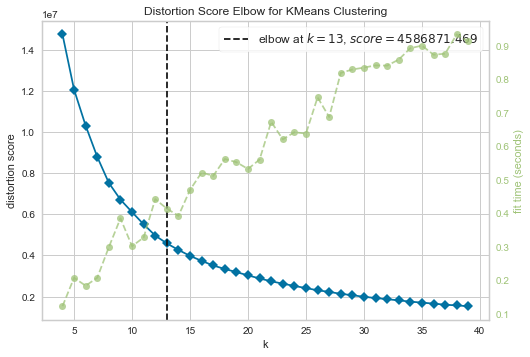

In [11]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

# It is really hard to find the best T-SNE perplexity even using the plot.
# I will go directly to the clustering with K-means and then evaluating the silhouette scores for each 
# kmeans model.

# Elbow method to find the best number of clusters using the library yellowbrick

elbow_cluster = []
for i in range(len(list_hyperparameter)):
# Instantiate the clustering model and visualizer
    model = KMeans()
    visualizer = KElbowVisualizer(model, k=(4,40))
    
    vis = visualizer.fit(list_hyperparameter[i])   
    elbow_cluster.append(vis)
    # Fit the data to the visualizer
    for j in range(len(elbow_cluster)):
        vis.show()        # Finalize and render the figure

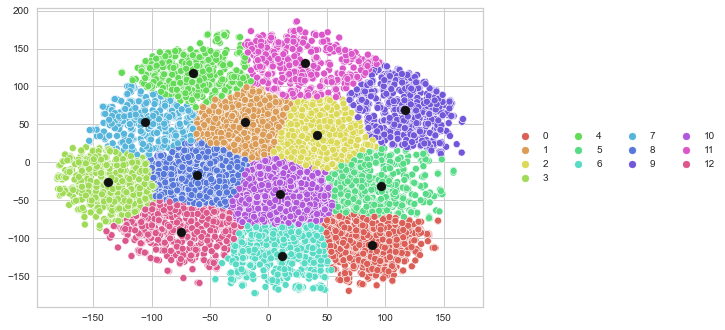

In [13]:
from sklearn.cluster import KMeans
import seaborn as sns

# K means for every tsne result with different hyperparameters to be tuned.
km = KMeans(n_clusters=13, max_iter=10000, n_init=50, random_state=42)
y_pred = km.fit_predict(list_hyperparameter[0])
label_zero = km.labels_
    
   
plot = sns.scatterplot(x=list_hyperparameter[0][:,0], y=list_hyperparameter[0][:,1], hue=km.labels_, 
                palette = sns.color_palette("hls", 13))
plot.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), ncol=4)
#Getting the Centroids
centroids = km.cluster_centers_

 
#plotting the results:
 
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')

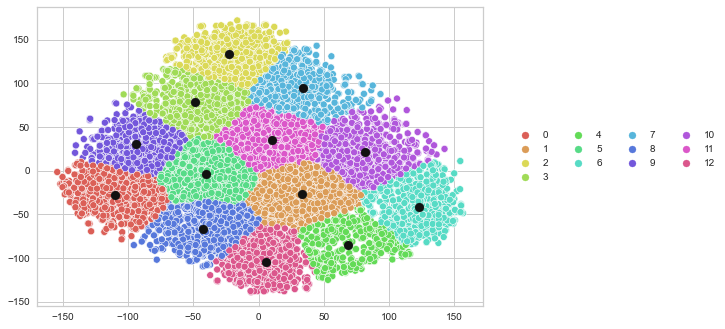

In [14]:



km = KMeans(n_clusters=13, max_iter=10000, n_init=50, random_state=42)
y_pred = km.fit_predict(list_hyperparameter[1])
label_one = km.labels_
    
   
plot = sns.scatterplot(x=list_hyperparameter[1][:,0], y=list_hyperparameter[1][:,1], hue=km.labels_, 
                palette = sns.color_palette("hls", 13))
plot.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), ncol=4)
#Getting the Centroids
centroids = km.cluster_centers_

 
#plotting the results:
 
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')

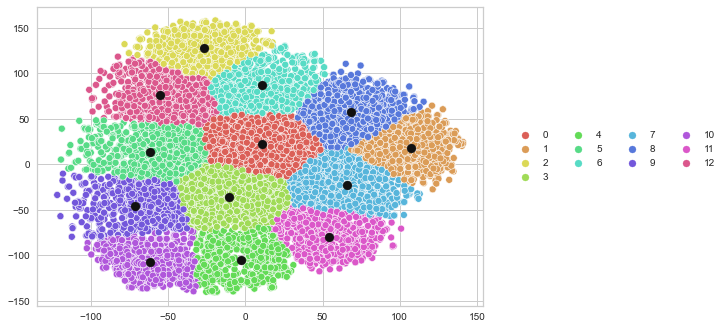

In [15]:
km = KMeans(n_clusters=13, max_iter=10000, n_init=50, random_state=42)
y_pred = km.fit_predict(list_hyperparameter[2])
label_two = km.labels_
    
   
plot = sns.scatterplot(x=list_hyperparameter[2][:,0], y=list_hyperparameter[2][:,1], hue=km.labels_, 
                palette = sns.color_palette("hls", 13))
plot.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), ncol=4)
#Getting the Centroids
centroids = km.cluster_centers_

 
#plotting the results:
 
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')

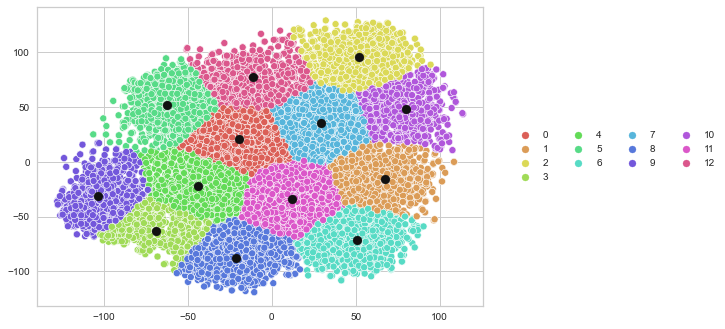

In [16]:
km = KMeans(n_clusters=13, max_iter=10000, n_init=50, random_state=42)
y_pred = km.fit_predict(list_hyperparameter[3])
label_three = km.labels_
    
   
plot = sns.scatterplot(x=list_hyperparameter[3][:,0], y=list_hyperparameter[3][:,1], hue=km.labels_, 
                palette = sns.color_palette("hls", 13))
plot.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), ncol=4)
#Getting the Centroids
centroids = km.cluster_centers_

 
#plotting the results:
 
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')

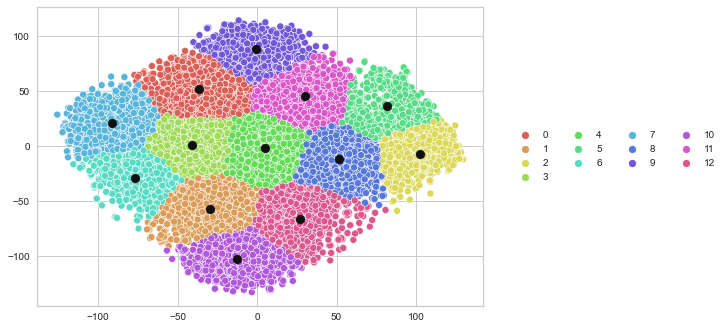

In [17]:
km = KMeans(n_clusters=13, max_iter=10000, n_init=50, random_state=42)
y_pred_four = km.fit_predict(list_hyperparameter[4])
label_four = km.labels_
    
   
plot = sns.scatterplot(x=list_hyperparameter[4][:,0], y=list_hyperparameter[4][:,1], hue=label_four, 
                palette = sns.color_palette("hls", 13))
plot.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), ncol=4)
#Getting the Centroids
centroids = km.cluster_centers_

 
#plotting the results:
 
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')

In [18]:
#We will create silhouette scores to judge how good our clustering was and which one is the best perplexity value

from sklearn.metrics import silhouette_samples, silhouette_score

# This code was modified from Sklearn's website:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

for i in range(len(list_hyperparameter)):
    for n_clusters in range(5, 25):
    
        clusterer = KMeans(n_clusters=n_clusters, max_iter=10000, n_init = 50, random_state=42)
        cluster_labels = clusterer.fit_predict(list_hyperparameter[i])
        silhouette_avg = silhouette_score(tsne_model, cluster_labels)
        print("For n_clusters =", n_clusters, 'the element: ', i,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(list_hyperparameter[i], cluster_labels)

For n_clusters = 5 the element:  0 The average silhouette_score is : 0.27115995
For n_clusters = 6 the element:  0 The average silhouette_score is : 0.22837141
For n_clusters = 7 the element:  0 The average silhouette_score is : 0.21282415
For n_clusters = 8 the element:  0 The average silhouette_score is : 0.18965833
For n_clusters = 9 the element:  0 The average silhouette_score is : 0.19272064
For n_clusters = 10 the element:  0 The average silhouette_score is : 0.1706247
For n_clusters = 11 the element:  0 The average silhouette_score is : 0.1550272
For n_clusters = 12 the element:  0 The average silhouette_score is : 0.14522646
For n_clusters = 13 the element:  0 The average silhouette_score is : 0.15019158
For n_clusters = 14 the element:  0 The average silhouette_score is : 0.1309979
For n_clusters = 15 the element:  0 The average silhouette_score is : 0.11097616
For n_clusters = 16 the element:  0 The average silhouette_score is : 0.111327246
For n_clusters = 17 the element:  0

In [19]:
# Perplexity of 50 gave the best silhoutte scores > 0.36 for k=13.

In [20]:
import plotly.express as px

fig = px.scatter(docs_df, x=list_hyperparameter[4][:,0], y=list_hyperparameter[4][:,1], color=label_four.astype(str),
                 hover_data=['id', 'categories', 'title'],
                 height= 1000, width=1000,
                 title = "t-SNE with Kmeans Labels")
fig.show()


In [21]:
# Add the cluster column to the dataframe

docs_df['cluster'] = label_four
docs_df.head(5)

,Unnamed: 0,id,authors,title,doi,categories,abstract,year,cluster
0,1025318,1809.05302,Gal Binyamini,Some effective estimates for Andr\'e-Oort in $...,NaN,math.AG math.LO math.NT,Let $X\subset Y(1)^n$ be a subvariety define...,2021,7
1,1367435,2010.11105,"Stanislav B\""ohm, Jakub Ber\'anek",Runtime vs Scheduler: Analyzing Dask's Overheads,10.1109/WORKS51914.2020.00006,cs.DC,Dask is a distributed task framework which i...,2021,6
2,1993790,quant-ph/0503095,"Cristopher Moore, Daniel Rockmore, Alexander R...",The Power of Strong Fourier Sampling: Quantum ...,NaN,quant-ph,"Many quantum algorithms, including Shor's ce...",2007,7
3,1327071,2007.15557,"Zhonghan Wu, Yiran Gao, Jian Dai, Tian Zhang a...",Switching dynamics of reconfigurable perfect s...,NaN,physics.optics nlin.PS,Dual-coupled structure is typically used to ...,2020,4
4,1318114,2007.06600,"Yujun Shen, Bolei Zhou",Closed-Form Factorization of Latent Semantics ...,NaN,cs.CV,A rich set of interpretable dimensions has b...,2021,10


Cluster: 0


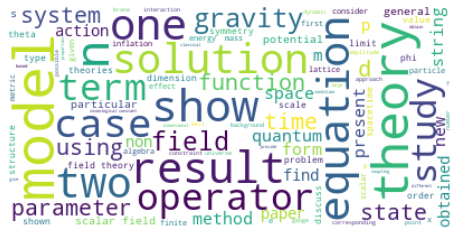

Cluster: 1


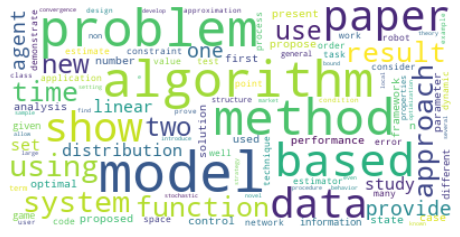

Cluster: 2


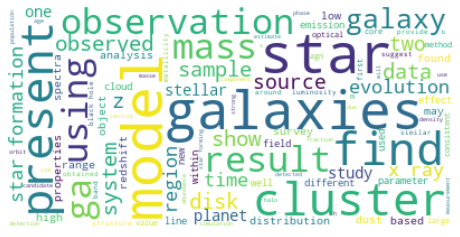

Cluster: 3


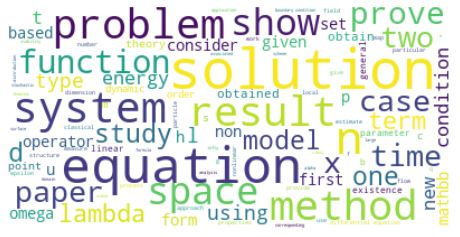

Cluster: 4


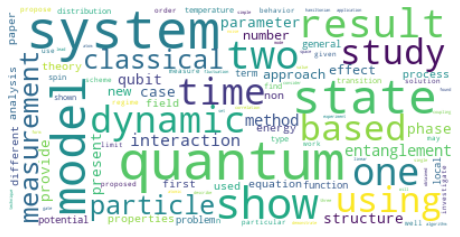

Cluster: 5


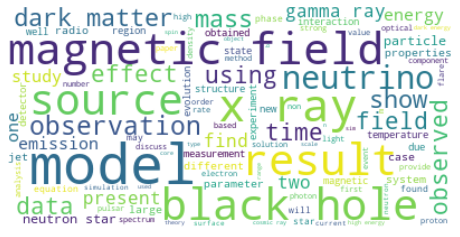

Cluster: 6


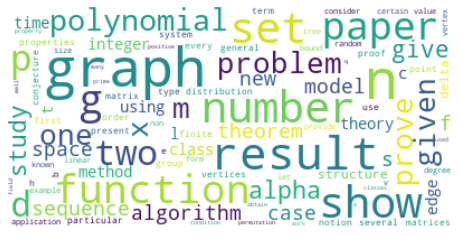

Cluster: 7


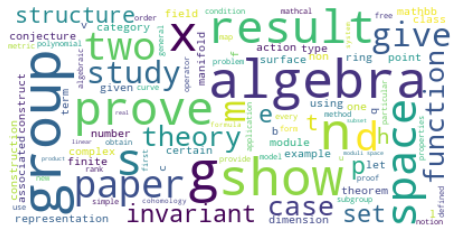

Cluster: 8


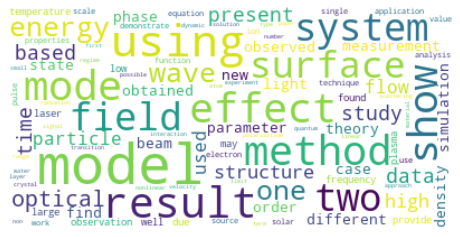

Cluster: 9


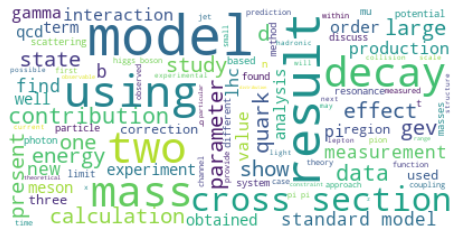

Cluster: 10


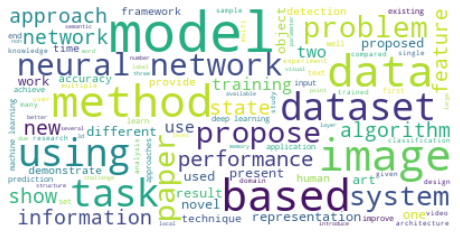

Cluster: 11


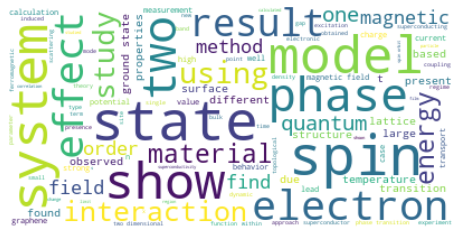

Cluster: 12


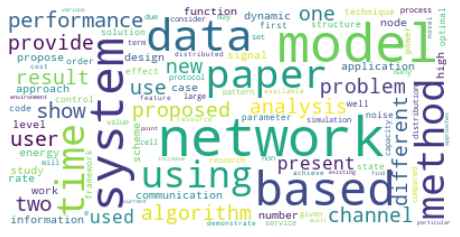

In [39]:
from wordcloud import WordCloud

# Using wordcloud we can see the words and the frecuency inside each cluster
# this can help us to find patterns in the text
# we will use the clusters with perplexity= 50

result={'cluster':label_four,'text': docs_df.abstract.values}
result=pd.DataFrame(result)

for k in range(0,13):
   s=result[result.cluster==k]
   text=s['text'].str.cat(sep=' ')
   text=text.lower()
   text=' '.join([word for word in text.split()])
   wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
   print('Cluster: {}'.format(k))
   
   plt.figure()
   plt.imshow(wordcloud, interpolation="bilinear")
   plt.axis("off")
   plt.show()

In [229]:
# create a list with the number of papers in each category for each cluster

df_cluster = []
# find the categories of each cluster
for i in range(0, 13):
    df_cluster_index = docs_df.loc[docs_df['cluster'] == i]
    grouped_categories = df_cluster_index.groupby(['categories']).count()
    grouped_categories = grouped_categories.sort_values(by = 'id', ascending = False)
    
    df_cluster.append(grouped_categories)
    
    

In [230]:
# Print the first 5 most published categories in each cluster

for i in range(len(df_cluster)):
    print('For cluster: ',i,  'the categories are: ', df_cluster[i].head(10))
    

For cluster:  0 the categories are:                  Unnamed: 0   id  authors  title  doi  abstract  year  cluster
categories                                                                   
hep-th                 186  186      186    186  136       186   186      186
math                    87   87       87     87   17        87    87       87
gr-qc                   53   53       53     53   36        53    53       53
cond-mat                45   45       45     45   31        45    45       45
physics                 32   32       32     32   14        32    32       32
gr-qc hep-th            25   25       25     25   19        25    25       25
astro-ph                24   24       24     24   20        24    24       24
hep-ph                  23   23       23     23   15        23    23       23
gr-qc astro-ph          23   23       23     23   19        23    23       23
quant-ph                17   17       17     17    7        17    17       17
For cluster:  1 the categor

In [ ]:
docs_df

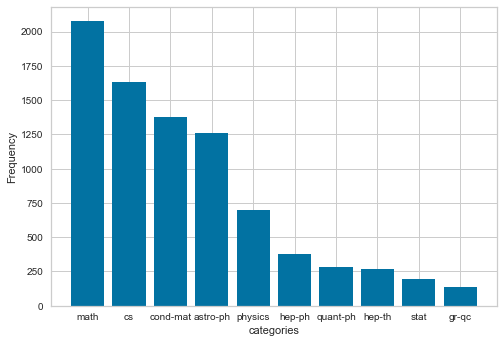

In [222]:
for i in range(0,13):
    if docs_df['cluster'].all() == i: 
        df_categories['number'] = docs_df['categories'].value_counts()
        df_categories_top = df_categories.head(10)
        
        df = pd.DataFrame(df_categories_top).reset_index()
        df.columns = ['categories', 'frequency']
        plt.bar(df['categories'], df['frequency'], align='center') # A bar chart
        plt.xlabel('categories')
        plt.ylabel('Frequency')
        plt.show()

In [225]:
df_categories_top

math        2077
cs          1633
cond-mat    1378
astro-ph    1262
physics      701
hep-ph       376
quant-ph     285
hep-th       271
stat         195
gr-qc        137
Name: categories, dtype: object